In [2]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
nodoubttome_skin_cancer9_classesisic_path = kagglehub.dataset_download('nodoubttome/skin-cancer9-classesisic')
surajghuwalewala_ham1000_segmentation_and_classification_path = kagglehub.dataset_download('surajghuwalewala/ham1000-segmentation-and-classification')

print('Data source import complete.')


Using Colab cache for faster access to the 'skin-cancer9-classesisic' dataset.
Using Colab cache for faster access to the 'ham1000-segmentation-and-classification' dataset.
Data source import complete.


In [3]:
import os

predpath = surajghuwalewala_ham1000_segmentation_and_classification_path

# List all subfolders and files
for root, dirs, files in os.walk(predpath):
    jpg_files = [f for f in files if f.endswith('.jpg')]
    if len(jpg_files) > 0:
        print("Found JPG files in:", root)
        print("Number of files:", len(jpg_files))


Found JPG files in: /kaggle/input/ham1000-segmentation-and-classification/images
Number of files: 10015


library

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(style="whitegrid")
import os
import glob as gb
import cv2
import tensorflow as tf
import keras

In [5]:
# open file
import os
print(os.listdir("/kaggle/input")) # open file
print("-----------------------------------------")

['skin-cancer9-classesisic', 'ham1000-segmentation-and-classification']
-----------------------------------------


In [6]:
import os
import glob as gb
import cv2
import tensorflow as tf
import keras

# Use the paths returned by kagglehub.dataset_download
trainpath = os.path.join(nodoubttome_skin_cancer9_classesisic_path, 'Skin cancer ISIC The International Skin Imaging Collaboration/Train')
testpath = os.path.join(nodoubttome_skin_cancer9_classesisic_path, 'Skin cancer ISIC The International Skin Imaging Collaboration/Test')
predpath = os.path.join(surajghuwalewala_ham1000_segmentation_and_classification_path, 'images')

In [7]:
results2 = []
for folder in  os.listdir(trainpath) :
    dies_name_count = {}
    files = gb.glob(pathname= str( trainpath +'/' + folder + '/*.jpg'))
    dies_name_count['disease']=folder
    dies_name_count['count_images']=len(files)
    results2.append(dies_name_count)
    print(f'For training data , found {len(files)} in folder {folder}')
pd.DataFrame(results2)

For training data , found 462 in folder pigmented benign keratosis
For training data , found 438 in folder melanoma
For training data , found 139 in folder vascular lesion
For training data , found 114 in folder actinic keratosis
For training data , found 181 in folder squamous cell carcinoma
For training data , found 376 in folder basal cell carcinoma
For training data , found 77 in folder seborrheic keratosis
For training data , found 95 in folder dermatofibroma
For training data , found 357 in folder nevus


,disease,count_images
0,pigmented benign keratosis,462
1,melanoma,438
2,vascular lesion,139
3,actinic keratosis,114
4,squamous cell carcinoma,181
5,basal cell carcinoma,376
6,seborrheic keratosis,77
7,dermatofibroma,95
8,nevus,357


In [8]:
results2 = []
for folder in  os.listdir(testpath) :
    dies_name_count = {}
    files = gb.glob(pathname= str( testpath +'/' + folder + '/*.jpg'))
    dies_name_count['disease']=folder
    dies_name_count['count_images']=len(files)
    results2.append(dies_name_count)
    print(f'For testing data , found {len(files)} in folder {folder}')
pd.DataFrame(results2)

For testing data , found 16 in folder pigmented benign keratosis
For testing data , found 16 in folder melanoma
For testing data , found 3 in folder vascular lesion
For testing data , found 16 in folder actinic keratosis
For testing data , found 16 in folder squamous cell carcinoma
For testing data , found 16 in folder basal cell carcinoma
For testing data , found 3 in folder seborrheic keratosis
For testing data , found 16 in folder dermatofibroma
For testing data , found 16 in folder nevus


,disease,count_images
0,pigmented benign keratosis,16
1,melanoma,16
2,vascular lesion,3
3,actinic keratosis,16
4,squamous cell carcinoma,16
5,basal cell carcinoma,16
6,seborrheic keratosis,3
7,dermatofibroma,16
8,nevus,16


In [9]:
code = {'actinic keratosis':3 ,'basal cell carcinoma':5,'dermatofibroma':7,'melanoma':1,'nevus':8,'pigmented benign keratosis':0,'seborrheic keratosis':6,'squamous cell carcinoma':7,'vascular lesion':2}
def getcode(n) :
    for x , y in code.items() :
        if n == y :
            return x

In [10]:
size = []
for folder in  os.listdir(trainpath) :
    files = gb.glob(pathname= str( trainpath +'/' + folder + '/*.jpg'))
    for file in files:
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

,count
"(450, 600, 3)",1443
"(768, 1024, 3)",393
"(2304, 3072, 3)",84
"(576, 767, 3)",80
"(802, 919, 3)",60
...,...
"(672, 964, 3)",1
"(711, 1007, 3)",1
"(2082, 2725, 3)",1
"(542, 724, 3)",1


In [11]:
size = []
for folder in  os.listdir(testpath) :
    files = gb.glob(pathname= str( testpath +'/' + folder + '/*.jpg'))
    for file in files:
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

,count
"(450, 600, 3)",69
"(767, 1022, 3)",17
"(1129, 1504, 3)",14
"(768, 1024, 3)",5
"(4419, 6668, 3)",2
"(1129, 1503, 3)",1
"(4399, 6668, 3)",1
"(4391, 6641, 3)",1
"(4421, 6641, 3)",1
"(4439, 6688, 3)",1


In [12]:
predpath="/kaggle/input/ham1000-segmentation-and-classification/images"
size = []
files = gb.glob(pathname= str(predpath +'/*.jpg'))
for file in files:
    image = plt.imread(file)
    size.append(image.shape)
pd.Series(size).value_counts()

,count
"(450, 600, 3)",10015


In [13]:
s = 200

In [14]:
X_train = []
y_train = []
for folder in  os.listdir(trainpath) :
    files = gb.glob(pathname= str( trainpath +'/' + folder + '/*.jpg'))
    for file in files:
        image = plt.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_train.append(list(image_array))
        y_train.append(code[folder])

In [15]:
print(f'we have {len(X_train)} items in X_train')

we have 2239 items in X_train


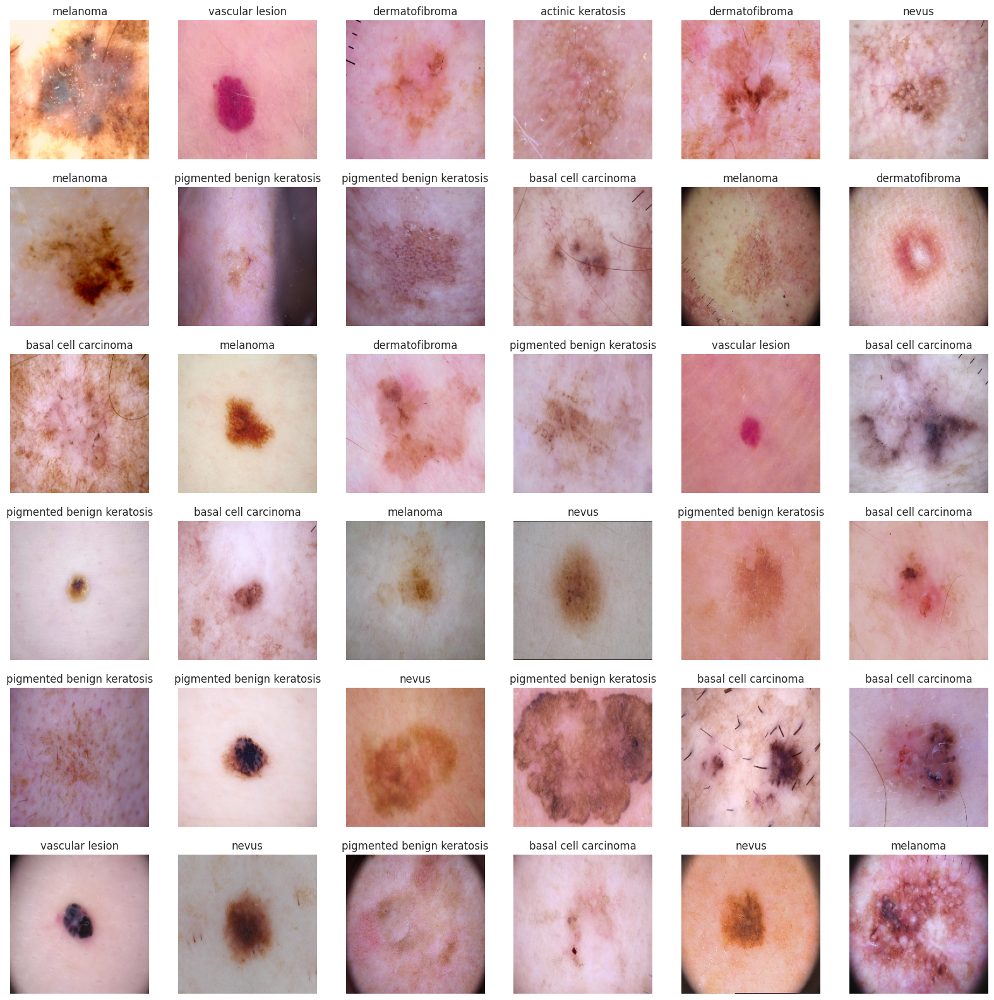

In [16]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_train),36))) :
    plt.subplot(6,6,n+1)
    plt.imshow(X_train[i])
    plt.axis('off')
    plt.title(getcode(y_train[i]))

In [17]:
X_test = []
y_test = []
for folder in  os.listdir(testpath) :
    files = gb.glob(pathname= str(testpath + '/' + folder + '/*.jpg'))
    for file in files:
        image = plt.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_test.append(list(image_array))
        y_test.append(code[folder])

In [18]:
print(f'we have {len(X_test)} items in X_test')

we have 118 items in X_test


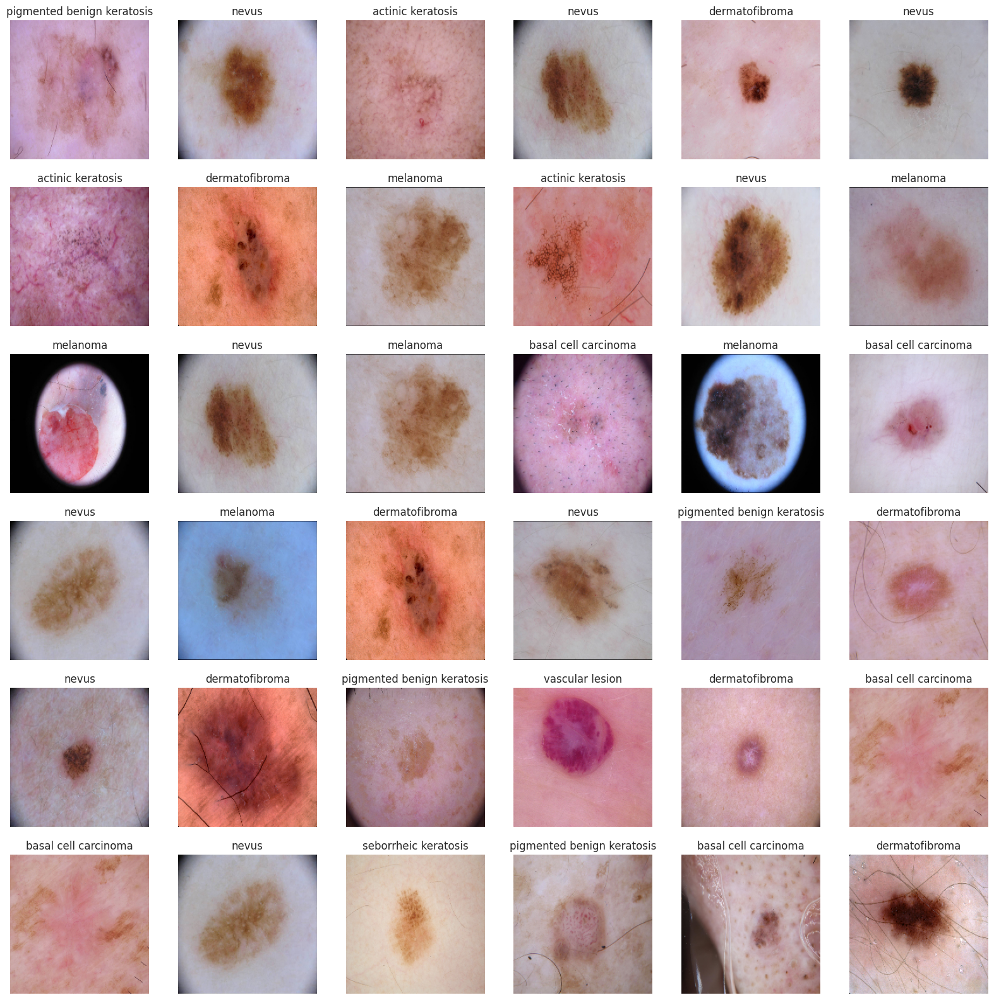

In [19]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_test),36))) :
    plt.subplot(6,6,n+1)
    plt.imshow(X_test[i])
    plt.axis('off')
    plt.title(getcode(y_test[i]))

In [20]:
X_pred = []
files = gb.glob(pathname= str(predpath + '/*.jpg'))
for file in files:
    image = plt.imread(file)
    image_array = cv2.resize(image , (s,s))
    X_pred.append(list(image_array))

We have 10015 images in X_pred.


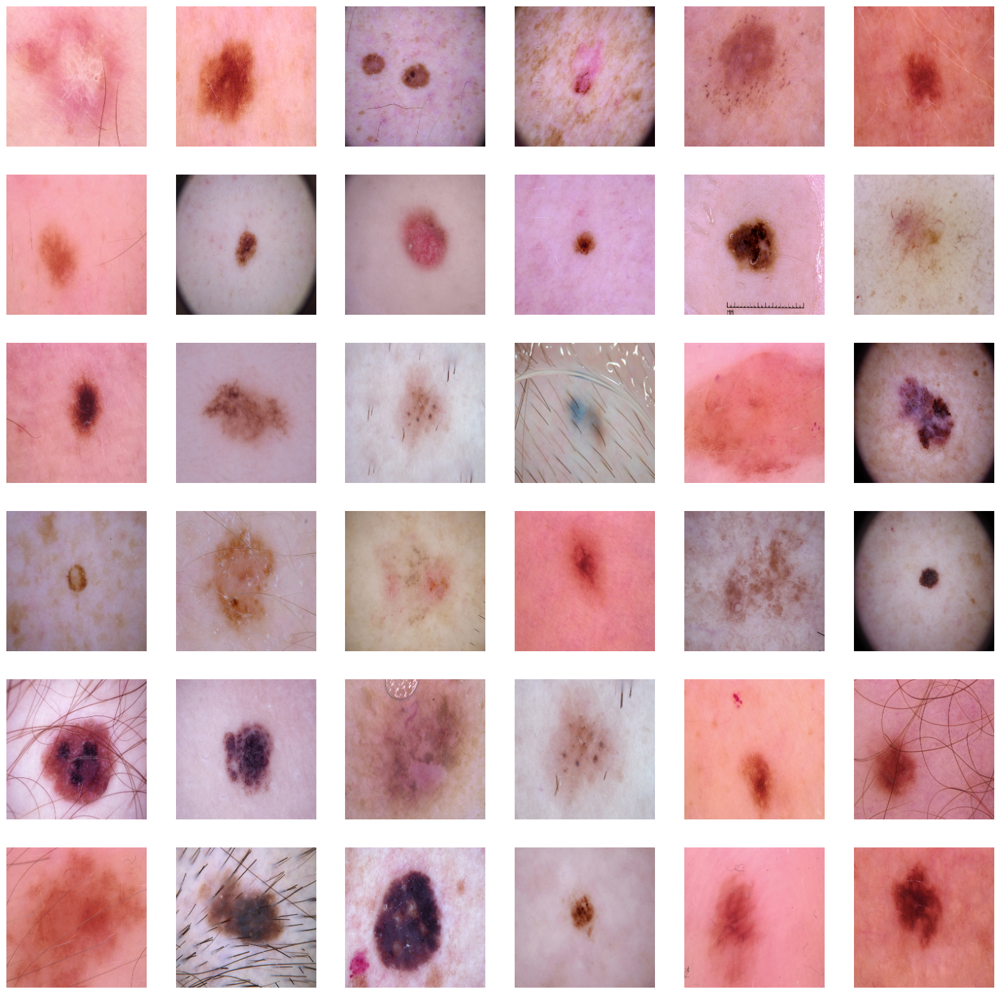

In [21]:

import glob as gb
import matplotlib.pyplot as plt
import cv2
import numpy as np
import os

X_pred = []
s = 224  # example size, change as needed

# Use recursive glob to get all jpg images in predpath and subfolders
files = gb.glob(os.path.join(predpath, '**', '*.jpg'), recursive=True)

if len(files) == 0:
    print(f"No images found in {predpath} or its subfolders.")
else:
    for file in files:
        image = plt.imread(file)
        image_array = cv2.resize(image, (s, s))
        X_pred.append(image_array)  # store as numpy array

    print(f"We have {len(X_pred)} images in X_pred.")

    # Display 36 random images
    plt.figure(figsize=(20, 20))
    n_samples = min(36, len(X_pred))
    random_indices = np.random.randint(0, len(X_pred), n_samples)
    for n, i in enumerate(random_indices):
        plt.subplot(6, 6, n + 1)
        plt.imshow(X_pred[i])
        plt.axis('off')
    plt.show()


In [22]:
print(f'we have {len(X_pred)} items in X_pred')

we have 10015 items in X_pred


We have 10015 items in X_pred


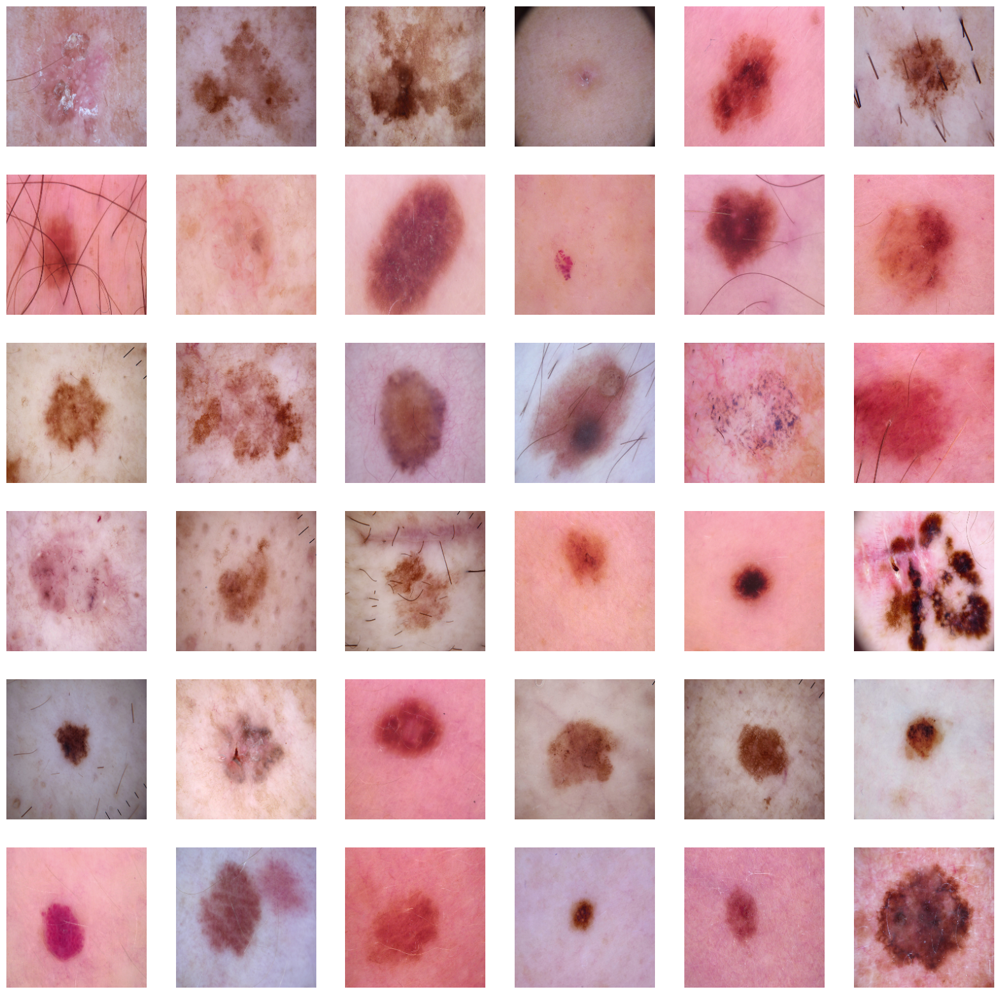

In [23]:
import glob as gb
import matplotlib.pyplot as plt
import cv2
import numpy as np

X_pred = []
files = gb.glob(str(predpath + '/*.jpg'))  # Make sure predpath is correct

if len(files) == 0:
    print(f"No images found in {predpath}")
else:
    for file in files:
        image = plt.imread(file)
        image_array = cv2.resize(image, (s, s))
        X_pred.append(image_array)  # no need to convert to list; keep as np.array

    print(f'We have {len(X_pred)} items in X_pred')

    plt.figure(figsize=(20,20))
    # Make sure you don’t try to pick more images than available
    n_samples = min(36, len(X_pred))
    random_indices = np.random.randint(0, len(X_pred), n_samples)

    for n, i in enumerate(random_indices):
        plt.subplot(6, 6, n+1)
        plt.imshow(X_pred[i])
        plt.axis('off')
    plt.show()


In [24]:
import os

# List all subfolders and files in predpath
for root, dirs, files in os.walk(predpath):
    print("Folder:", root)
    jpg_files = [f for f in files if f.endswith('.jpg')]
    print("Number of JPG files:", len(jpg_files))


Folder: /kaggle/input/ham1000-segmentation-and-classification/images
Number of JPG files: 10015


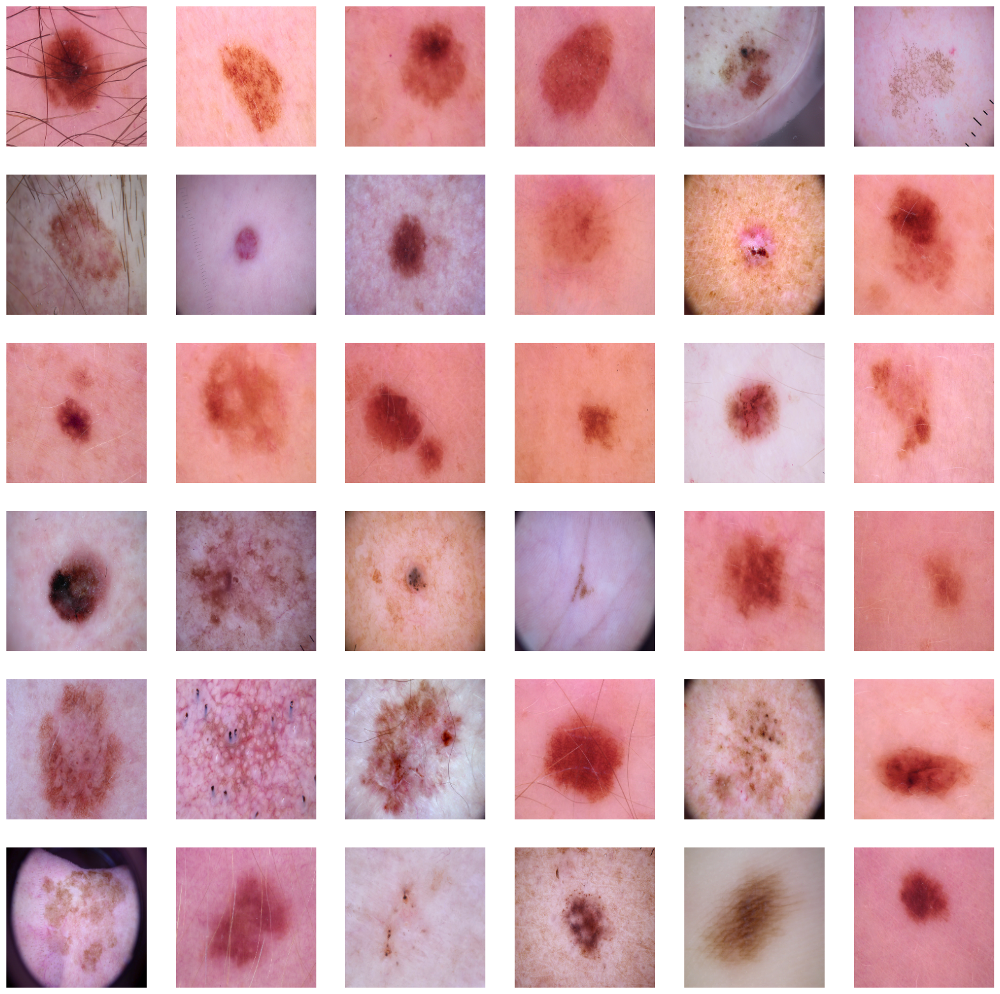

In [25]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) :
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])
    plt.axis('off')

In [26]:
X_train = np.array(X_train)
X_test = np.array(X_test)
X_pred_array = np.array(X_pred)
y_train = np.array(y_train)
y_test = np.array(y_test)
print(f'X_train shape  is {X_train.shape}')
print(f'X_test shape  is {X_test.shape}')
print(f'X_pred shape  is {X_pred_array.shape}')
print(f'y_train shape  is {y_train.shape}')
print(f'y_test shape  is {y_test.shape}')

X_train shape  is (2239, 200, 200, 3)
X_test shape  is (118, 200, 200, 3)
X_pred shape  is (10015, 224, 224, 3)
y_train shape  is (2239,)
y_test shape  is (118,)


In [31]:
from tensorflow.keras import layers, models

KerasModel = models.Sequential([
    layers.Conv2D(200, (3,3), activation='relu', input_shape=(s,s,3)),
    layers.Conv2D(180, (3,3), activation='relu'),
    layers.Conv2D(150, (3,3), activation='relu'),
    layers.Conv2D(120, (3,3), activation='relu'),
    layers.MaxPool2D(4,4),
    layers.Conv2D(110, (3,3), activation='relu'),
    layers.Conv2D(100, (3,3), activation='relu'),
    layers.Conv2D(80, (3,3), activation='relu'),
    layers.Conv2D(50, (3,3), activation='relu'),
    layers.MaxPool2D(4,4),
    layers.GlobalAveragePooling2D(),   # <-- replaces Flatten()
    layers.Dense(150, activation='relu'),
    layers.Dense(120, activation='relu'),
    layers.Dense(100, activation='relu'),
    layers.Dropout(0.25),
    layers.Dense(9, activation='softmax'),
])


In [32]:
KerasModel.compile(optimizer ='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

In [33]:
print('Model Details are : ')
print(KerasModel.summary())

Model Details are : 


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_8 (Conv2D)               │ (None, 222, 222, 200)  │         5,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 220, 220, 180)  │       324,180 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 218, 218, 150)  │       243,150 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 216, 216, 120)  │       162,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 54, 54, 120)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 52, 52, 110)    │       118,910 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 50, 50, 100)    │        99,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 48, 48, 80)     │        72,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 46, 46, 50)     │        36,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 11, 11, 50)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 50)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 150)            │         7,650 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 120)            │        18,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 100)            │        12,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 9)              │           909 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,099,969 (4.20 MB)

 Trainable params: 1,099,969 (4.20 MB)

 Non-trainable params: 0 (0.00 B)

None


In [ ]:
epochs = 70
ThisModel = KerasModel.fit(X_train, y_train, epochs=epochs,batch_size=64,verbose=1)

Epoch 1/70


In [ ]:
ModelLoss, ModelAccuracy = KerasModel.evaluate(X_test, y_test)
print('Test Loss is {}'.format(ModelLoss))
print('Test Accuracy is {}'.format(ModelAccuracy ))

In [ ]:
ModelLoss, ModelAccuracy = KerasModel.evaluate(X_train, y_train)
print('Test Loss is {}'.format(ModelLoss))
print('Test Accuracy is {}'.format(ModelAccuracy ))

In [ ]:
y_pred = KerasModel.predict(X_test)

print('Prediction Shape is {}'.format(y_pred.shape))

In [ ]:
y_result = KerasModel.predict(X_pred_array)

print('Prediction Shape is {}'.format(y_result.shape))

In [ ]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) :
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])
    plt.axis('off')
    plt.title(getcode(np.argmax(y_result[i])))

In [ ]:
KerasModel.save('v1_alpaca_model.h5')

In [ ]:
KerasModel.save_weights('v1_alpaca_weights.h5')